# Generating anime with GANs
Fabian Aguilar Gomez (fcy527)<br>
CS4973 Final Project <br>
The purpose of this project was to study how Generative Adversarial Networks work (GANs). A generator and discriminator networks were created in order to attempt to generate anime images and determine the FID to measure the GAN<br>
Implementation referenced from Tensorflow, PyTorch, Medium, and Kaggle

## Imports
Import the libraries needed

In [ ]:
#imports
%tensorflow_version 1.x
import numpy as np
import os
import matplotlib.pyplot as plt
import cv2
import keras
import time
import glob
import PIL
import tensorflow as tf
from IPython import display
from keras.optimizers import Adam
from keras.models import Sequential, Model
from keras.layers import Dense, LeakyReLU, BatchNormalization, Reshape, Flatten, Input
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Conv2DTranspose
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize
import warnings
warnings.filterwarnings('ignore')
path = "data/data/"

TensorFlow 1.x selected.


Using TensorFlow backend.


## Read the data
The data is containted in the google drive so we will mount the drive and unzip the zipped files. The images will be stored into a data folder within the local directory in google colab.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/anime/anime.zip' -d data

Streaming output truncated to the last 5000 lines.
 extracting: data/data/5499.png      
  inflating: data/data/55.png        
 extracting: data/data/550.png       
 extracting: data/data/5500.png      
 extracting: data/data/5501.png      
 extracting: data/data/5502.png      
 extracting: data/data/5503.png      
 extracting: data/data/5504.png      
 extracting: data/data/5505.png      
 extracting: data/data/5506.png      
 extracting: data/data/5507.png      
 extracting: data/data/5508.png      
 extracting: data/data/5509.png      
 extracting: data/data/551.png       
 extracting: data/data/5510.png      
 extracting: data/data/5511.png      
 extracting: data/data/5512.png      
 extracting: data/data/5513.png      
 extracting: data/data/5514.png      
 extracting: data/data/5515.png      
 extracting: data/data/5516.png      
 extracting: data/data/5517.png      
 extracting: data/data/5518.png      
 extracting: data/data/5519.png      
 extracting: data/data/552.png       

In [ ]:
#Load the images
def loadImgs(dir=''):
    images = [] #array for the images
    imagePaths = [img for img in glob.glob("data/data/*.png")]

    #lopp the imagePaths to to get all images
    for path in imagePaths:
        #Read the image, resize if needed, and convert it to RGB
        img = cv2.imread(path)
        img = cv2.resize(img,(64,64))
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        images.append(img)
    return images

In [ ]:
#Load the images
images = loadImgs('data')

### Plot some images
Plot some images to show how the data will look like. We are expecting RGB images of size 64x64 with anime faces

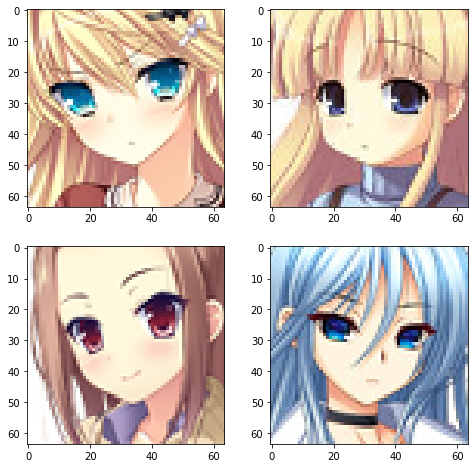

In [ ]:
#Plot some images
fig,ax = plt.subplots(2,2, figsize = (8,8)) 
ax[0,0].imshow(images[1])
ax[1,1].imshow(images[2])
ax[0,1].imshow(images[4])
ax[1,0].imshow(images[9]);

## Model
Create the DCGAN model with the generator and discriminator networks. They will be split as we weill have to deal with developing both the networks seperately and finally combine them together.

### Generator
Create a Generator network that will generate an image from noise and be able trick the discriminator that the image is real. When we convolve up we the parameters are:


*   Padding will be the same
*   Linear activation function <br>

LeakyReLu layers will be settled after Dense and BatchNormalization layers with a final activation of tanh. The generated image is expected to have a 64x64 RGB image that has been generated by noise. 


In [ ]:
#Create the generator network
def Generator():
    #avoid division by 0
    epsilon = 0.0001 
    #noise vector
    noise = (100,)
    noiseShape = (noise)
    initializer =  keras.initializers.TruncatedNormal(stddev=0.02)
    model = Sequential([
            Dense(4*4*512, activation='linear', input_shape=noiseShape),
            LeakyReLU(alpha=0.2),
            Reshape((4, 4, 512)),
            Conv2DTranspose(512, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= initializer),
            BatchNormalization(momentum=0.9, epsilon=epsilon),
            LeakyReLU(alpha=0.2),


            Conv2DTranspose(256, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= initializer),
            BatchNormalization(momentum=0.9, epsilon=epsilon),
            LeakyReLU(alpha=0.2),

            
            Conv2DTranspose(128, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= initializer),
            BatchNormalization(momentum=0.9, epsilon=epsilon),
            LeakyReLU(alpha=0.2),
        
            Conv2DTranspose(64, kernel_size=[4,4], strides=[2,2], padding="same",
                                  kernel_initializer= initializer),
            BatchNormalization(momentum=0.9, epsilon=epsilon),
            LeakyReLU(alpha=0.2),
        
            Conv2DTranspose(3, kernel_size=[4,4], strides=[1,1], padding="same",
                                  kernel_initializer= initializer),
            Activation("tanh")
    ])
    #Print out the model
    model.summary()
    #get the noise and image
    noise = Input(shape=noiseShape)
    img = model(noise)
    return Model(noise,img)

#### Generate an image from the generator
Create a generator and print the information of it and generate the first image.
The compiled generator will have a loss of binary corssentropy with an Adam optimizer as these seem to be the best parameters for training a generator network.

In [ ]:
generator = Generator()
#Compile the generator
generator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002,0.5))

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 8192)              827392    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8192)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 512)         4194816   
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 512)         2048      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 512)         0         
_______________________________________

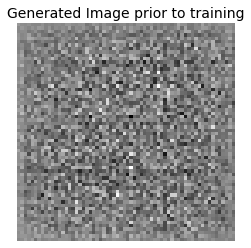

In [ ]:
#Generate one image
noise = np.random.normal(0,1, (1,100))
genImg = generator.predict(noise)
plt.imshow(genImg[0, :, :, 0],cmap='gray')
plt.axis("off")
plt.title("Generated Image prior to training",fontsize=14);

### Discriminator
Create a discriminator network that will attempt to see if the image generated by the generator is real or fake. The discriminator network will take in a generated 64x64 image and using the data provided from the training dataset it will attempt to determine if the image provived is indeed fake or real. Since we are training the generator the discriminator will be locked and won't be trained as we only want to train one network at a time. The discriminator network will have the opposite for lack of better word layers. We will convolve and use the same LeakyReLu and BatchNormalization in order to determine the image. Additionally, we have some Dropout layers since we want to prevent the discriminator from overfitting.

In [ ]:
#Build the discriminator
def Discriminator():
    imageShape = (64,64,3) #RGB 64x64 image
    model = Sequential([
            Conv2D(128,(3,3),padding='same',input_shape=imageShape),
            LeakyReLU(alpha=0.2),
            BatchNormalization(),

            Conv2D(128,(3,3),padding='same'),
            LeakyReLU(alpha=0.2),
            BatchNormalization(),
            MaxPooling2D(pool_size=(3,3)),
            Dropout(0.2),

            Conv2D(128,(3,3),padding='same'),
            LeakyReLU(alpha=0.2),
            BatchNormalization(),

            Conv2D(128,(3,3),padding='same'),
            LeakyReLU(alpha=0.2),
            BatchNormalization(),
            MaxPooling2D(pool_size=(3,3)),
            Dropout(0.3),

            Flatten(),
            Dense(128),
            LeakyReLU(alpha=0.2),

            Dense(128),
            LeakyReLU(alpha=0.2),
            Dense(1,activation='sigmoid')
    ])
    #Print the model out
    model.summary()
    #get the image and valid
    img = Input(shape=imageShape)
    valid = model(img)
    return Model(img, valid)

####Compile the discriminator
The compiled discriminator will have the same loss and optimizer as the generator and the metric which will be tested on will be the accuracy.

In [ ]:
discriminator = Discriminator()
#Compile the discriminator
discriminator.compile(loss='binary_crossentropy',
                         optimizer=Adam(0.0002,0.5),
                         metrics=['accuracy'])


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 64, 64, 128)       3584      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 64, 64, 128)       512       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       147584    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 64, 64, 128)       512       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 21, 21, 128)     

## GAN Model
Create the GAN model using the two networks. Both of the networks created above will come together in order to generate a GAN network model architecture. We will set the first model, the generator, as the first "layer" the input will go through and the second model, the discriminator, to be the following.

In [ ]:
def GAN(generator,discriminator):
    #Variables for the input of the networks
    imageShape = (64,64,3)
    noiseSize = 100
    optimizer = Adam(1e-4,0.5)
    
    #Compile the discriminator
    discriminator.compile(loss='binary_crossentropy',
                         optimizer=optimizer,
                         metrics=['accuracy'])
    #Compile the generator
    generator.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    #Combine the networks
    gan = Sequential([
            generator,
            discriminator
    ])
    
    discriminator.trainable = False
    gan.compile(loss='binary_crossentropy',optimizer=optimizer)
    
    gan.summary()
    return gan

###Lock the discriminator
Lock the discriminator from being trained since as mentioned we only want to focus in training one network at a time. For the purposed of this experiment we want to train the generator to generate images and thus the discriminator will be locked from being trained.

In [ ]:
gan = GAN(generator,discriminator)
discriminator.trainable = False

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_1 (Model)              (None, 64, 64, 3)         7782083   
_________________________________________________________________
model_2 (Model)              (None, 1)                 1267969   
Total params: 9,050,052
Trainable params: 7,780,163
Non-trainable params: 1,269,889
_________________________________________________________________


## Create a training loop
Create a method to train the models and generate the image. The training loop will have default values for:


*   Batch size: size of the number of images we are taking in 
*   Metrics update: how often should we update our metrics in the model (epochs)
*   SaveImgs: How often to save an image that was genereted (epochs)
*   SaveModel: How often to save the model weights and the model itself (epochs)<br>

In order to be able to plot the information such as loss and accuracy we will have a list that will keep track of the information and append to it when we update our metrics. Additinonally, this training lopp generates an image and uses the discriminator to tell if the image is real or fake. The use of mean loss is used in order to determine the discriminator loss aswell as the generator loss as we progress through the iterations. <br>

A function saveImgs has been created in order to modularize the saving of the images into the directory specified in the funcion it has been set to 'fakeFaces' as the default directory but this can be changed.


In [ ]:
def train(GAN,generator,discriminator,epochs, batchSize=128, metricsUpdate=50, saveImgs=100, saveModel=2000,):
    #Keep Track of the losses
    totalGL = []
    totalDL = []
    totalAc = []
    epochList= []
    #Get the images to train
    xTrain = np.array(images)
    xTrain = (xTrain.astype(np.float32) - 127.5) / 127.5
    halfBatch = int(batchSize/2)
    
    #Create the losses
    meanDiscriminatorLoss=[0,0]
    meanGeneratorLoss = 0
    
    #Training loop
    for epoch in range(epochs):
        #Get an image
        index = np.random.randint(0,xTrain.shape[0], halfBatch)
        imgs = xTrain[index]
        
        #Get the noise and generate images
        noise = np.random.normal(0, 1, (halfBatch, 100))
        genImgs = generator.predict(noise)
        
        #Loss of discriminator
        discriminatorLoss = 0.5 * np.add(discriminator.train_on_batch(imgs, np.ones((halfBatch,1))),
                                         discriminator.train_on_batch(genImgs, np.zeros((halfBatch,1))))
    
        #Noise to train generator
        noise = np.random.normal(0,1,(batchSize,100))
        
        #Get the mean loss
        validY = np.array([1]*batchSize)
        generatorLoss = GAN.train_on_batch(noise,validY)
        
        meanDiscriminatorLoss[0] += discriminatorLoss[0]
        meanDiscriminatorLoss[1] += discriminatorLoss[1]
        meanGeneratorLoss += generatorLoss
        
        #Update metrics
        if epoch % metricsUpdate == 0:
            print ("Epoch: %d \nDiscriminator loss: %f, acc.: %.2f%% \nGenerator loss: %f" %
                   (epoch, meanDiscriminatorLoss[0]/metricsUpdate, 100*meanDiscriminatorLoss[1]/metricsUpdate, 
                    meanGeneratorLoss/metricsUpdate))
            totalGL.append(meanGeneratorLoss/metricsUpdate)
            totalDL.append(meanDiscriminatorLoss[0]/metricsUpdate)
            totalAc.append(100*meanDiscriminatorLoss[1]/metricsUpdate)
            epochList.append(epoch)
            meanDiscriminatorLoss=[0,0]
            meanGeneratorLoss = 0

        #save n images
        if epoch % saveImgs == 0:
            saveImages(generator,epoch)
    return totalGL, totalDL,totalAc

In [ ]:
def saveImages(generator, epoch):
    noise = np.random.normal(0,1, (25,100))
    genImgs = generator.predict(noise)
    
    #Rescale images
    genImgs = 0.5 * genImgs + 0.5
    
    #Plot some images
    fig, axs = plt.subplots(5,5, figsize = (8,8))

    for i in range(5):
        for j in range(5):
            axs[i,j].imshow(genImgs[5*i+j])
            axs[i,j].axis('off')

    plt.show()

    fig.savefig("fakeFaces/Faces_%d.png" % epoch)
    plt.close()

Epoch: 0 
Discriminator loss: 0.020129, acc.: 0.09% 
Generator loss: 0.000881


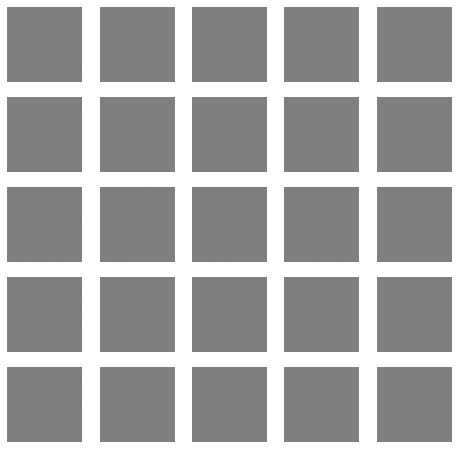

Epoch: 200 
Discriminator loss: 0.262583, acc.: 89.76% 
Generator loss: 2.513004
Epoch: 400 
Discriminator loss: 0.299891, acc.: 88.02% 
Generator loss: 2.770468
Epoch: 600 
Discriminator loss: 0.295573, acc.: 87.93% 
Generator loss: 2.995421
Epoch: 800 
Discriminator loss: 0.314485, acc.: 86.82% 
Generator loss: 3.490762
Epoch: 1000 
Discriminator loss: 0.361508, acc.: 84.17% 
Generator loss: 3.550102


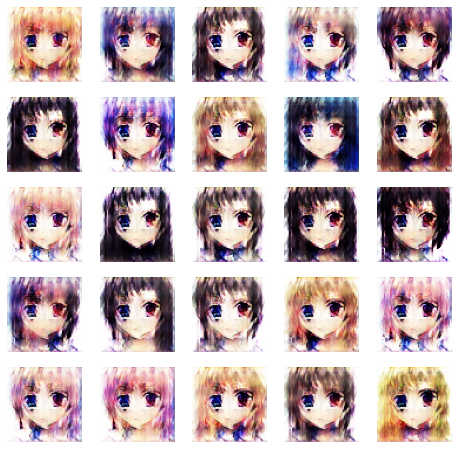

Epoch: 1200 
Discriminator loss: 0.241634, acc.: 90.18% 
Generator loss: 3.296305
Epoch: 1400 
Discriminator loss: 0.212426, acc.: 91.55% 
Generator loss: 3.754516
Epoch: 1600 
Discriminator loss: 0.230699, acc.: 90.82% 
Generator loss: 3.881822
Epoch: 1800 
Discriminator loss: 0.223371, acc.: 91.11% 
Generator loss: 3.835342
Epoch: 2000 
Discriminator loss: 0.194484, acc.: 92.47% 
Generator loss: 4.218061


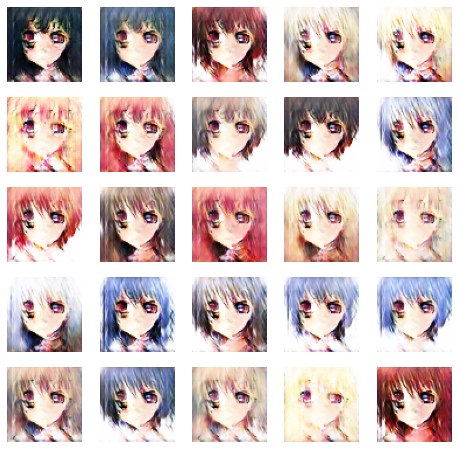

Epoch: 2200 
Discriminator loss: 0.194980, acc.: 92.25% 
Generator loss: 3.852114
Epoch: 2400 
Discriminator loss: 0.214144, acc.: 91.42% 
Generator loss: 4.277992
Epoch: 2600 
Discriminator loss: 0.216438, acc.: 91.37% 
Generator loss: 4.218180
Epoch: 2800 
Discriminator loss: 0.210745, acc.: 91.60% 
Generator loss: 4.062460
Epoch: 3000 
Discriminator loss: 0.206291, acc.: 91.78% 
Generator loss: 4.178168


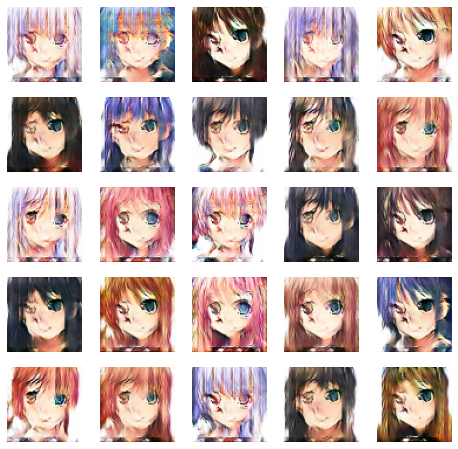

Epoch: 3200 
Discriminator loss: 0.189634, acc.: 92.69% 
Generator loss: 4.189264
Epoch: 3400 
Discriminator loss: 0.226503, acc.: 91.18% 
Generator loss: 3.986595
Epoch: 3600 
Discriminator loss: 0.187915, acc.: 92.71% 
Generator loss: 4.061770
Epoch: 3800 
Discriminator loss: 0.186642, acc.: 92.56% 
Generator loss: 4.333851
Epoch: 4000 
Discriminator loss: 0.204396, acc.: 91.81% 
Generator loss: 4.231853


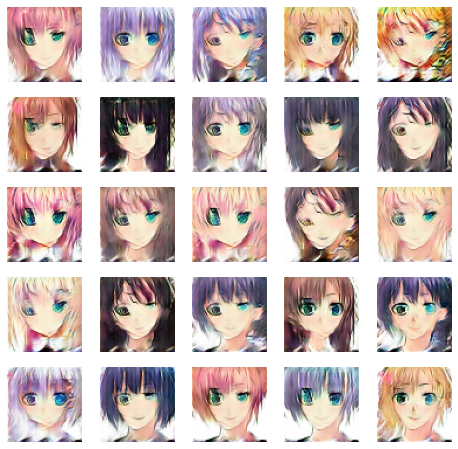

Epoch: 4200 
Discriminator loss: 0.202843, acc.: 92.16% 
Generator loss: 3.933531
Epoch: 4400 
Discriminator loss: 0.240498, acc.: 90.02% 
Generator loss: 4.184981
Epoch: 4600 
Discriminator loss: 0.208954, acc.: 91.65% 
Generator loss: 3.555751
Epoch: 4800 
Discriminator loss: 0.245310, acc.: 90.38% 
Generator loss: 3.461044
Epoch: 5000 
Discriminator loss: 0.215408, acc.: 91.38% 
Generator loss: 3.796693


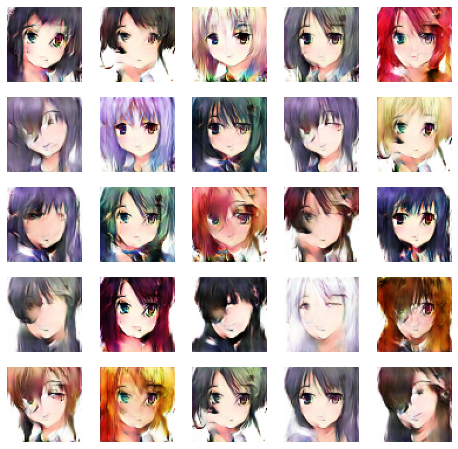

Epoch: 5200 
Discriminator loss: 0.237121, acc.: 90.76% 
Generator loss: 3.909757
Epoch: 5400 
Discriminator loss: 0.253266, acc.: 89.62% 
Generator loss: 3.952645
Epoch: 5600 
Discriminator loss: 0.239239, acc.: 90.26% 
Generator loss: 3.378776
Epoch: 5800 
Discriminator loss: 0.223128, acc.: 91.16% 
Generator loss: 3.238861
Epoch: 6000 
Discriminator loss: 0.213335, acc.: 91.45% 
Generator loss: 3.230049


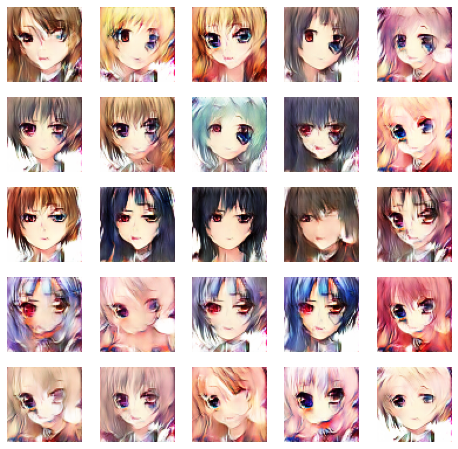

Epoch: 6200 
Discriminator loss: 0.252383, acc.: 89.73% 
Generator loss: 3.802971
Epoch: 6400 
Discriminator loss: 0.239351, acc.: 90.24% 
Generator loss: 3.628039
Epoch: 6600 
Discriminator loss: 0.234840, acc.: 90.44% 
Generator loss: 3.827872
Epoch: 6800 
Discriminator loss: 0.280661, acc.: 88.10% 
Generator loss: 3.935698
Epoch: 7000 
Discriminator loss: 0.267877, acc.: 88.84% 
Generator loss: 3.767034


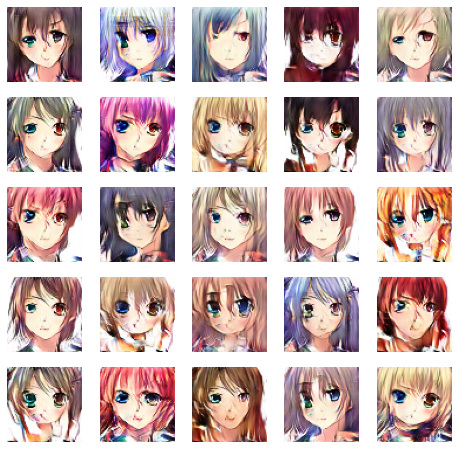

Epoch: 7200 
Discriminator loss: 0.272473, acc.: 88.65% 
Generator loss: 3.917741
Epoch: 7400 
Discriminator loss: 0.247966, acc.: 89.71% 
Generator loss: 3.744807
Epoch: 7600 
Discriminator loss: 0.251971, acc.: 89.56% 
Generator loss: 3.771148
Epoch: 7800 
Discriminator loss: 0.263205, acc.: 89.14% 
Generator loss: 4.014016
Epoch: 8000 
Discriminator loss: 0.251908, acc.: 89.38% 
Generator loss: 4.010836


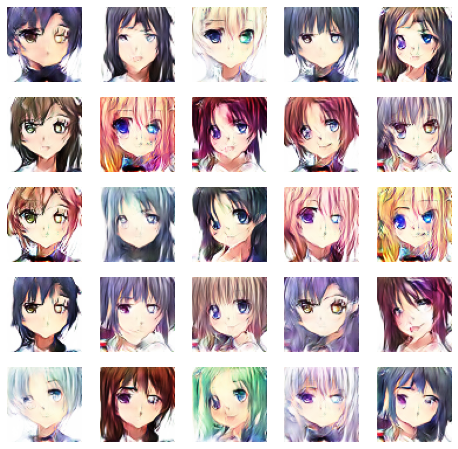

Epoch: 8200 
Discriminator loss: 0.250547, acc.: 89.60% 
Generator loss: 4.111360
Epoch: 8400 
Discriminator loss: 0.255130, acc.: 89.43% 
Generator loss: 4.028612
Epoch: 8600 
Discriminator loss: 0.243684, acc.: 90.02% 
Generator loss: 3.941487
Epoch: 8800 
Discriminator loss: 0.248303, acc.: 89.90% 
Generator loss: 3.847955
Epoch: 9000 
Discriminator loss: 0.251491, acc.: 89.62% 
Generator loss: 3.814655


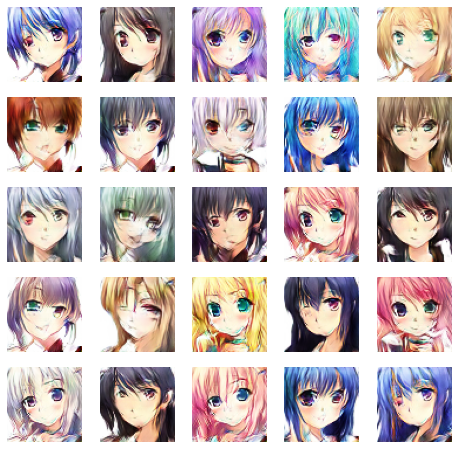

Epoch: 9200 
Discriminator loss: 0.234484, acc.: 90.45% 
Generator loss: 3.747927
Epoch: 9400 
Discriminator loss: 0.257809, acc.: 89.34% 
Generator loss: 3.862663
Epoch: 9600 
Discriminator loss: 0.240965, acc.: 89.98% 
Generator loss: 3.925793
Epoch: 9800 
Discriminator loss: 0.252624, acc.: 89.49% 
Generator loss: 3.939374


In [ ]:
genLoss, discLoss, totalAc = train(gan,generator,discriminator,10000, 256, 200, 1000, 200);

## Model Results

### Save Model Weights
Save the generator and discriminator weights as we won't have to re-train the model if we need to adjust it or need it for some image generation later on.

In [ ]:
#Save the model weights
generator.save_weights('/content/drive/My Drive/Colab Notebooks/generator/generator')
discriminator.save_weights('/content/drive/My Drive/Colab Notebooks/discriminator/discriminator')
#Save the model
generator.save('/content/drive/My Drive/Colab Notebooks/generator/generatorModel')
discriminator.save('/content/drive/My Drive/Colab Notebooks/discriminator/discriminatorModel')

#### Generate an image after training
Load the weights and generate and image after training the model

In [ ]:
#Load the model
generator.load_weights('/content/drive/My Drive/Colab Notebooks/generator/generator')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


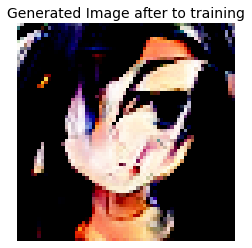

In [ ]:
#Generate one image
noise = np.random.normal(0,1, (1,100))
genImg = generator.predict(noise)[0, :, :, ]
plt.imshow(genImg)
plt.axis("off")
plt.title("Generated Image after to training",fontsize=14);

### Plot the information
Plot the statistics for the loss and accuracy after training the model. From the model it's determined that the generation of images and progress of them stalled around the 2000 epoch. This is partly contributed to the discriminator not being trained on thus the generator was able to fool the discriminator. This caused for the images to not have any progress this problem could be fixed by locking the generator from training and allowing the discriminator to train for a while and then repeating the process.

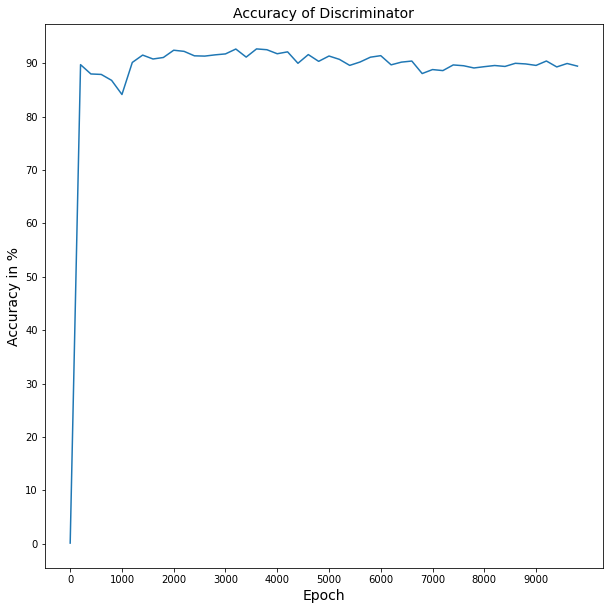

In [ ]:
#Plot the discriminator accuracy
plt.figure(figsize=(10,10))
plt.plot(range(50),totalAc);
plt.title("Accuracy of Discriminator",fontsize=14)
plt.xticks(np.arange(50,step=5), np.arange(10000,step=1000))
plt.yticks(np.arange(100,step=10))
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Accuracy in %", fontsize=14);

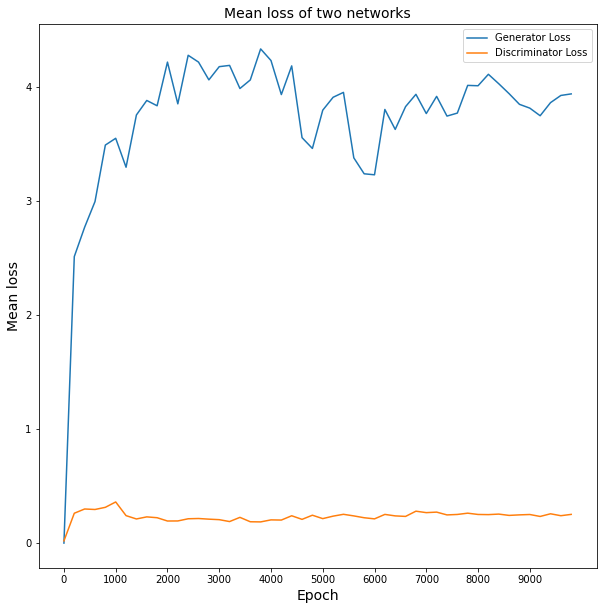

In [ ]:
#Plot the Loss of generator accuracy
plt.figure(figsize=(10,10))
plt.plot(range(50),genLoss, label='Generator Loss')
plt.plot(range(50),discLoss, label='Discriminator Loss')
plt.title("Mean loss of two networks",fontsize=14)
plt.xticks(np.arange(50,step=5), np.arange(10000,step=1000))
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Mean loss", fontsize=14)
plt.legend();

## Calculate FID score for current dataset
Calculate the FID score between the real and fake images. The FID score is often used as the best way to measure how effective a GAN is in generating images. A lower FID score is desired as it means the image is almost identical as it's images that it has been trained on. The InceptionV3 model was used in order to calculate the FID score as it's the best way to be able to calculate it.

In [ ]:
def calculateFid(model, image1, image2):
    #Calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)
    #Calculate mean
    mu1 = act1.mean(axis=1)
    mu2 = act2.mean(axis=1)
    #Calculate sum squared difference between means
    ssdiff = np.sum((mu1-mu2)**2.0)
    #Calculate covarience
    sigma1 = np.cov(act1,rowvar=False)
    sigma2 = np.cov(act2,rowvar=False)
    #square rot of product bnetween cov
    covmean = sqrtm(sigma1.dot(sigma2))
    #Check and correct imaginary numbers
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    #calculate score
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

In [ ]:
def rescaleImages(images,newShape):
    imageLst = list()
    for image in images:
        #Resize the image and append
        newImg = resize(image,newShape,0)
        imageLst.append(newImg)
    return np.asarray(imageLst)

In [ ]:
model = InceptionV3(include_top=False, pooling='avg', input_shape=(75,75,3))


87916544/87910968 [==============================] - 1s 0us/step


In [ ]:
#Rescale the images
images1 = rescaleImages(generator.predict(np.random.normal(0,1, (25,100))),(75,75,3))
images2 = rescaleImages(images[:25],(75,75,3))
print("Rescaled images", images1.shape, images2.shape)

Rescaled images (25, 75, 75, 3) (25, 75, 75, 3)


In [ ]:
#pre-process the images
images1 = preprocess_input(images1)
images2 = preprocess_input(images2)

In [ ]:
#calculate fid
fid = calculateFid(model,images1,images2)
print('FID: %.3f' % fid)

FID: 222.246


## Test selfie2Anime dataset
Test the selfie2anime dataset to compare result. This dataset was used in order to compare the model that was created to other models that have attempted to generate anime faces using other types of models. The model will be trained with a fraction of epochs that it was first trained on as it was found that it stalled on progress around the 2000 epoch. Thus, this time the model was trained on a smaller number of epochs and the FID score was computed in order to compare it. The same process as the one above was used to train this dataset the load function was just copied and pasted with a different directory name as the default for convience.

In [ ]:
#Load the images
def loadAnimeImgs(dir=''):
    images = [] #array for the images
    imagePaths = [img for img in glob.glob("Train/*.jpg")]

    #lopp the imagePaths to to get all images
    for path in imagePaths:
        #Read the image, resize if needed, and convert it to RGB
        img = cv2.imread(path)
        img = cv2.resize(img,(64,64))
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        images.append(img)
    return images

In [ ]:
#load the imgaes
images = loadAnimeImgs("Train")

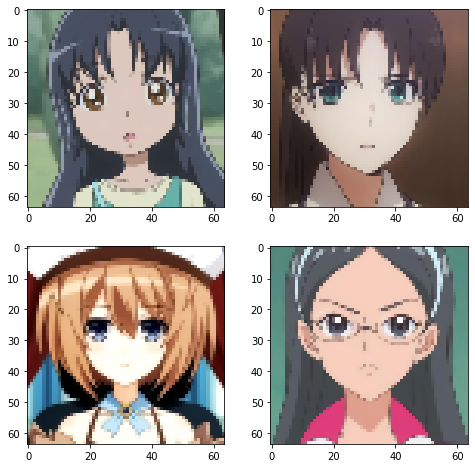

In [ ]:
#Plot images
#Plot some images
fig,ax = plt.subplots(2,2, figsize = (8,8)) 
ax[0,0].imshow(images[1])
ax[1,1].imshow(images[2])
ax[0,1].imshow(images[4])
ax[1,0].imshow(images[9]);

Epoch: 0 
Discriminator loss: 0.001417, acc.: 0.45% 
Generator loss: 0.011833


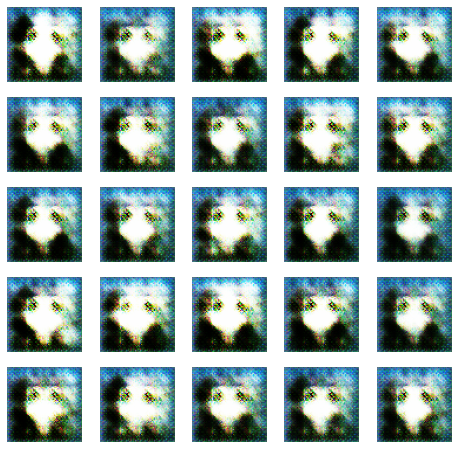

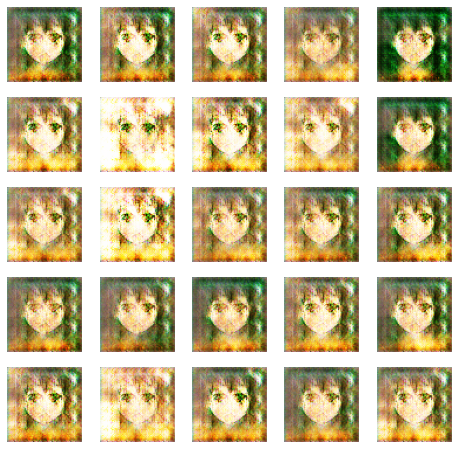

Epoch: 200 
Discriminator loss: 0.274528, acc.: 89.13% 
Generator loss: 3.679514


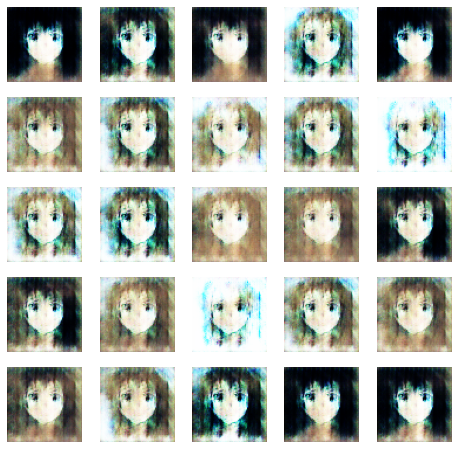

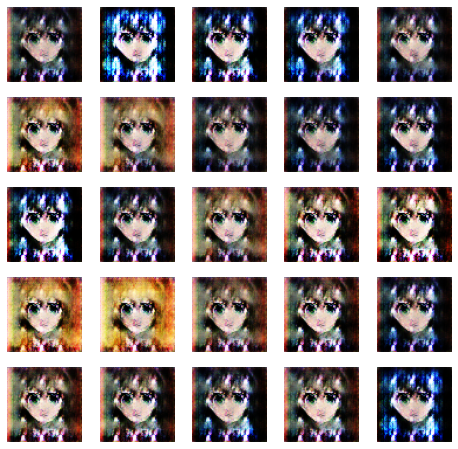

Epoch: 400 
Discriminator loss: 0.168232, acc.: 94.54% 
Generator loss: 2.931600


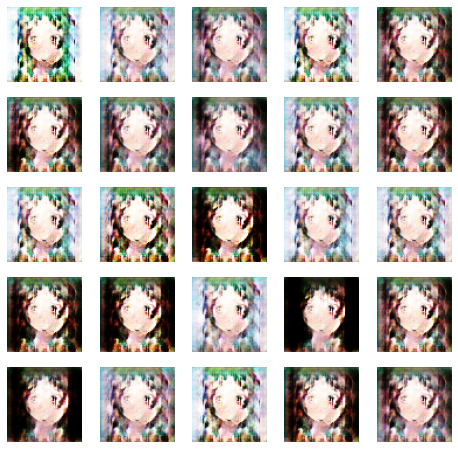

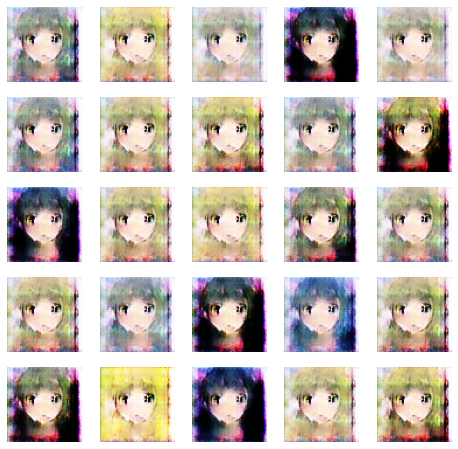

Epoch: 600 
Discriminator loss: 0.116778, acc.: 96.21% 
Generator loss: 3.468505


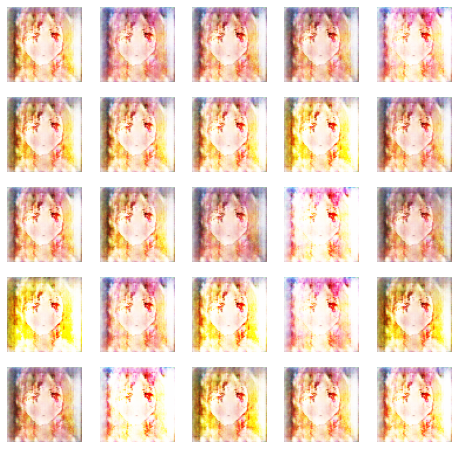

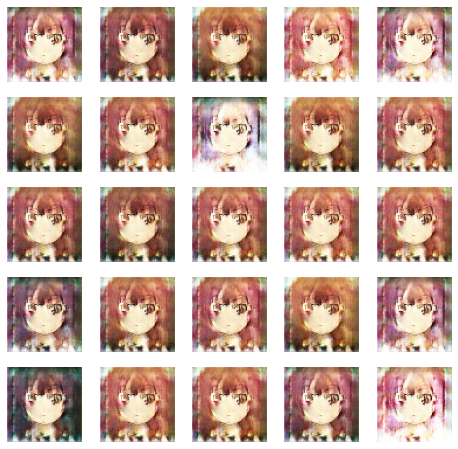

Epoch: 800 
Discriminator loss: 0.124355, acc.: 95.82% 
Generator loss: 3.367682


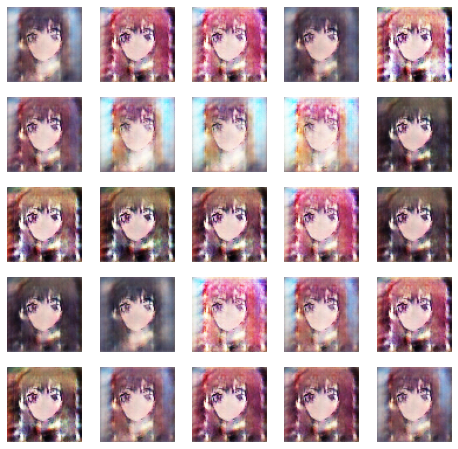

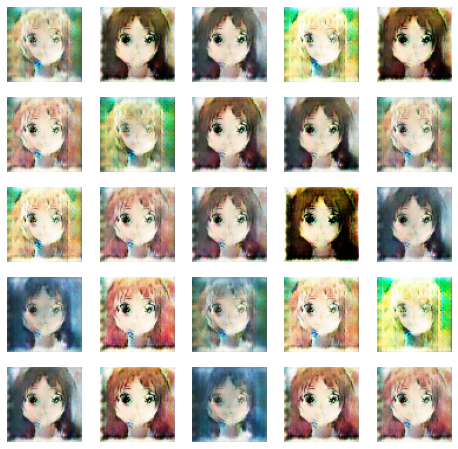

Epoch: 1000 
Discriminator loss: 0.111174, acc.: 96.27% 
Generator loss: 4.555961


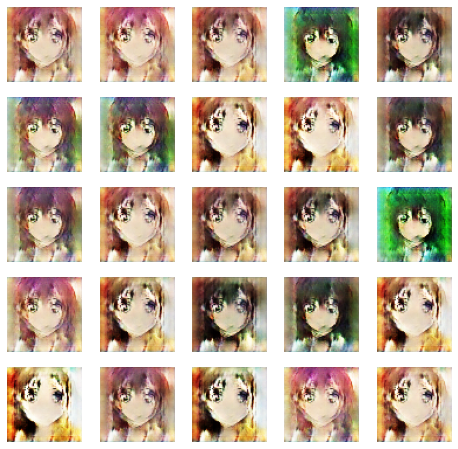

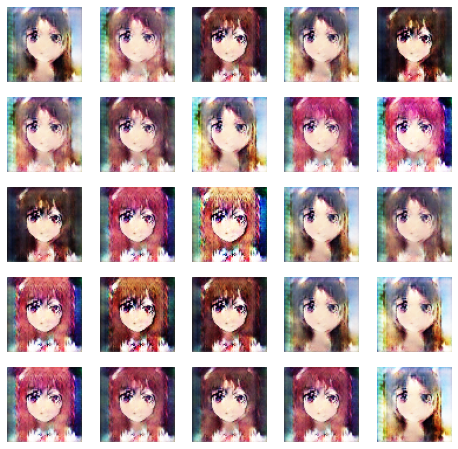

Epoch: 1200 
Discriminator loss: 0.097261, acc.: 97.12% 
Generator loss: 5.195728


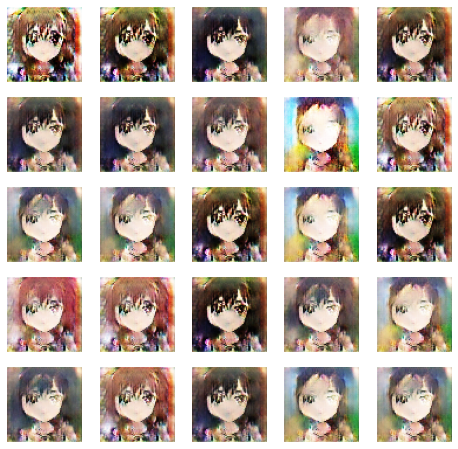

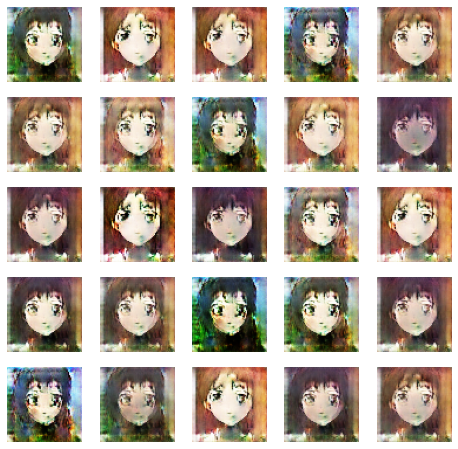

Epoch: 1400 
Discriminator loss: 0.091346, acc.: 97.22% 
Generator loss: 5.761357


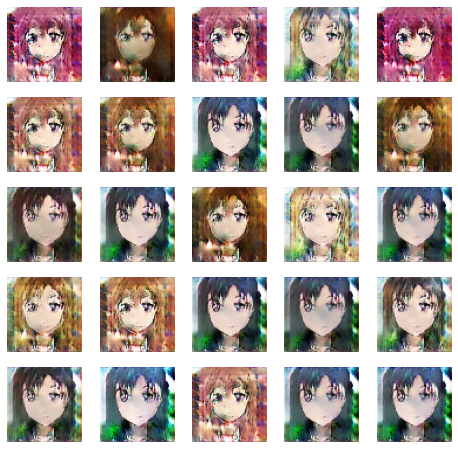

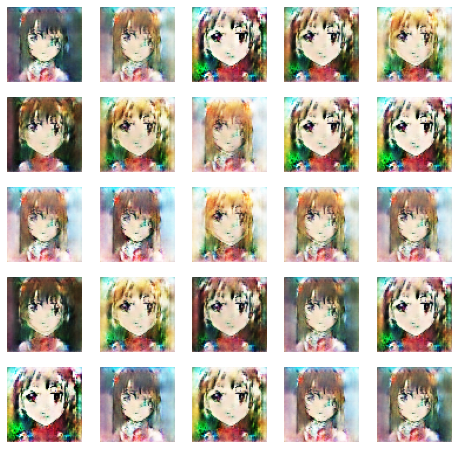

Epoch: 1600 
Discriminator loss: 0.072991, acc.: 97.95% 
Generator loss: 5.868385


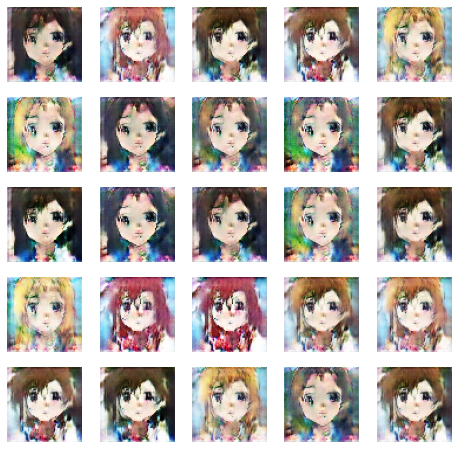

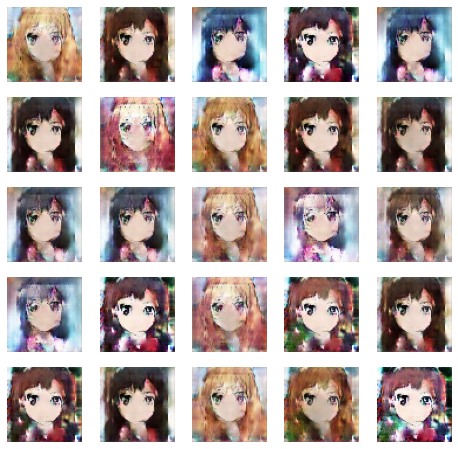

Epoch: 1800 
Discriminator loss: 0.054850, acc.: 98.36% 
Generator loss: 6.278815


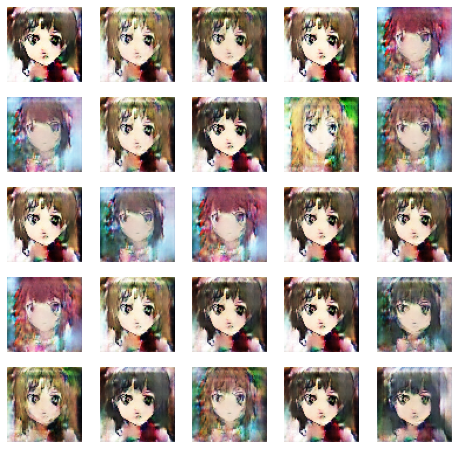

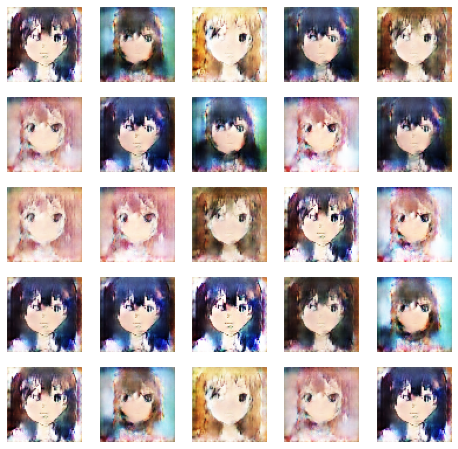

In [ ]:
genLoss, discLoss, totalAc = train(gan,generator,discriminator,2000, 256, 200, 100, 200);

In [ ]:
#Rescale the images
images1 = rescaleImages(generator.predict(np.random.normal(0,1, (25,100))),(75,75,3))
images2 = rescaleImages(images[:25],(75,75,3))
print("Rescaled images", images1.shape, images2.shape)

Rescaled images (25, 75, 75, 3) (25, 75, 75, 3)


In [ ]:
#pre-process the images
images1 = preprocess_input(images1)
images2 = preprocess_input(images2)

In [ ]:
#calculate fid
fid = calculateFid(model,images1,images2)
print('FID: %.3f' % fid)

FID: 160.389
